In [2]:
# Standard library imports
import re
import sys, os
import warnings
from enum import Enum
import numpy as np
import matplotlib.pyplot as plt
# First-party imports
sys.path.append(os.path.expanduser('~/Seacast'))
from src.seacast_tools.scoring_analysis import *

from tqdm.notebook import tqdm
# Set up session settings
warnings.filterwarnings('ignore', category=FutureWarning)

In [3]:
# Create a Enums for different types
class NNodes(Enum):
    def __init__(self, num, alias):
        self.num = num
        self.alias = alias

    N14_9 = ("14_9", "5_4")
    N20_9 = ("20_9", "6_4")
    N34_20 = ("34_20", "8_6")
    N52_27 = ("52_27", "10_7")
    N159_78 = ("159_78", "17_12")

    @classmethod
    def get(cls, key):
        for member in cls:
            if key in (member.num, member.alias, member.name):
                return member
        raise ValueError(f"{key} no corresponde a ningún miembro")

class TypeMesh(Enum):
    crossing_edges = 'crossing_edges'
    non_crossing_edges = 'non_crossing_edges'
    bathymetry = 'bathymetry'
    fps = 'fps'

class TypeScore(Enum):
    RMSE = 'SquaredError'
    MAE = 'AbsoluteError'
    Bias = 'Error'

class TypeVariable(Enum):
    sst_temperature = 'sst_temperature'

class LeadTime(Enum):
    one_lead_day = np.array(86400000000000, dtype='timedelta64[ns]')
    two_lead_days = np.array(172800000000000, dtype='timedelta64[ns]')
    three_lead_days = np.array(259200000000000, dtype='timedelta64[ns]')
    four_lead_days = np.array(345600000000000, dtype='timedelta64[ns]')
    five_lead_days = np.array(432000000000000, dtype='timedelta64[ns]')
    six_lead_days = np.array(518400000000000, dtype='timedelta64[ns]')
    seven_lead_days = np.array(604800000000000, dtype='timedelta64[ns]')
    eight_lead_days = np.array(691200000000000, dtype='timedelta64[ns]')
    nine_lead_days = np.array(777600000000000, dtype='timedelta64[ns]')
    ten_lead_days = np.array(864000000000000, dtype='timedelta64[ns]')
    eleven_lead_days = np.array(950400000000000, dtype='timedelta64[ns]')
    twelve_lead_days = np.array(1036800000000000, dtype='timedelta64[ns]')
    thirteen_lead_days = np.array(1123200000000000, dtype='timedelta64[ns]')
    fourteen_lead_days = np.array(1209600000000000, dtype='timedelta64[ns]')
    fifteen_lead_days = np.array(1296000000000000, dtype='timedelta64[ns]')

In [4]:
# data_processing.py
# ------------------
# Convert experiments to a nested dictionary of statistics
def as_stats_dict(
    experiments: List[StatsLoader],
    agg_dims: List[str]
    ) -> Dict[TypeMesh, Dict[NNodes, Dict[TypeScore, Dict[TypeVariable, xr.DataArray]]]]:
    """Convert a list of experiments into a nested dictionary of statistics grouped by:
        - The last character of the experiment name (assumed to be an integer).
        - The substring of the experiment name before the first occurrence of '_m'.
    """
    # Regular expression patterns
    patron_key1 = r'^.*?(?=_m)'
    patron_key2 = r'(?<=_m_)\d+_\d+'
    # Initialize the nested dictionary
    d = defaultdict(dict)
    for exp in tqdm(experiments):
        with StatsAggSession(exp) as stats:
            lead_time_scores = stats.agg_scores(
                agg_dims,
                )
            key_1 = TypeMesh(re.search(patron_key1, exp.name).group(0))
            key_2 = NNodes.get(re.search(patron_key2, exp.name).group(0))
            d[key_1][key_2] = lead_time_scores
    return d

In [5]:
%%time
# number of nodes sequence for unstructured and structured meshes
unstructured_nodes = ["14_9", "20_9", "34_20", "52_27", "159_78"]
structured_nodes = ["5_4", "6_4", "8_6", "10_7", "17_12"]
# mesh file names sequences
bathy_mesh_names = [f"bathymetry_m_{node}_g2mm2g_4" for node in unstructured_nodes]
fps_mesh_names = [f"fps_m_{node}_g2mm2g_4" for node in unstructured_nodes]
crossing_mesh_names = [f"crossing_edges_m_{node}_g2mm2g_4" for node in structured_nodes]
non_crossing_mesh_names = [f"non_crossing_edges_m_{node}_g2mm2g_4" for node in structured_nodes]
# all experiment names
experiments_names = (
    bathy_mesh_names 
    + fps_mesh_names 
    + crossing_mesh_names 
    + non_crossing_mesh_names
)
    
# load all experiments
experiments = [
    StatsLoader(os.path.join("~/Seacast/output/increase_n_nodes", exp_name)) 
    for exp_name in experiments_names
    ]

# Create a dictionary of experiments grouped by the last character of the experiment name
exp_dic = as_stats_dict(experiments, ['init_time', 'latitude', 'longitude'])  

  0%|          | 0/20 [00:00<?, ?it/s]

CPU times: user 3min 26s, sys: 3min 30s, total: 6min 56s
Wall time: 6min 56s


In [7]:
# Plot lead time scores for different mesh types
def plot_rmse(
    exp_dic: Dict[TypeMesh, Dict[NNodes, Dict[TypeScore, Dict[TypeVariable, xr.DataArray]]]],
    n_nodes: NNodes,
    axs: plt.Axes = None,
    ) -> Tuple[plt.Figure, plt.Axes]:
    # Number of rows for the plot grid depending on the number of scores
    
    for mesh in TypeMesh:
        # Plot a specific score and variable for all experiments
        score = TypeScore.RMSE.value
        variable = TypeVariable.sst_temperature.value
        data = exp_dic[mesh][n_nodes][score][variable]
        # Plot each score and variable in the grid
        lead_days = data.lead_time.data.astype('timedelta64[D]')
        axs.plot(lead_days, data.data, marker='o', linestyle='-', label=mesh.value)
        axs.set_xlabel("Lead Time (days)")
        axs.set_ylabel(f"{score} - {variable} (K)")
        title_n_nodes = n_nodes.value[0] if isinstance(n_nodes.value, tuple) else n_nodes.value
        axs.set_title(f"Lead Time RMSE - grid to mesh connections: {title_n_nodes}")
        axs.legend()
    return axs

In [8]:
def get_global_min_max(
    exp_dic: Dict[TypeMesh, Dict[NNodes, Dict[TypeScore, Dict[TypeVariable, xr.DataArray]]]],
    ) -> Tuple[float, float]:
    """Compute the global minimum and maximum values across all experiments for a specific score and variable."""
    variable = TypeVariable.sst_temperature.value
    score = TypeScore.RMSE.value
    glob_min, glob_max = 0.0, 0.0
    for lead_day in LeadTime:
        for mesh in TypeMesh:
            lead_day_scores = []
            for enum in NNodes:
                if enum not in exp_dic[mesh]:
                    continue
                lead_day_scores.append(
                    exp_dic[mesh][enum][score][variable]
                    .sel(lead_time=lead_day.value).data.item()
                    )
            vmin, vmax = min(lead_day_scores), max(lead_day_scores)
            glob_min = min(glob_min, vmin)
            glob_max = max(glob_max, vmax)
    return glob_min, glob_max

In [9]:
glob_min, glob_max = get_global_min_max(exp_dic)
glob_min, glob_max

(0.0, 0.5791263580322266)

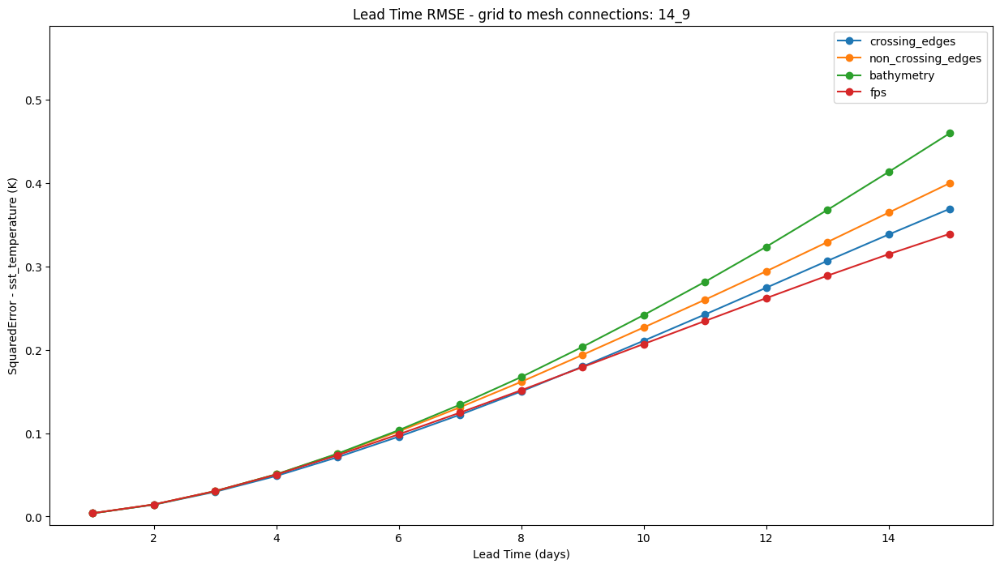

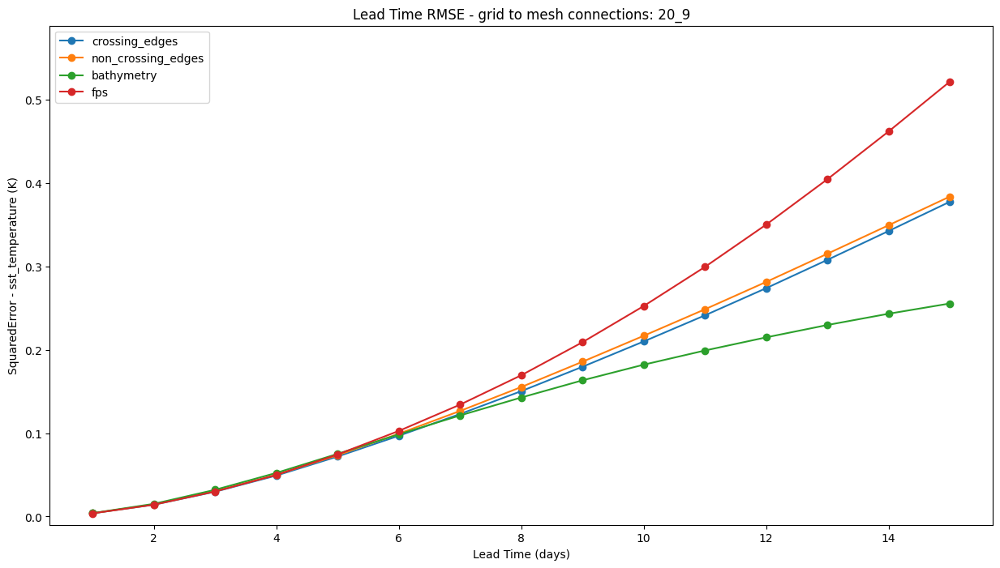

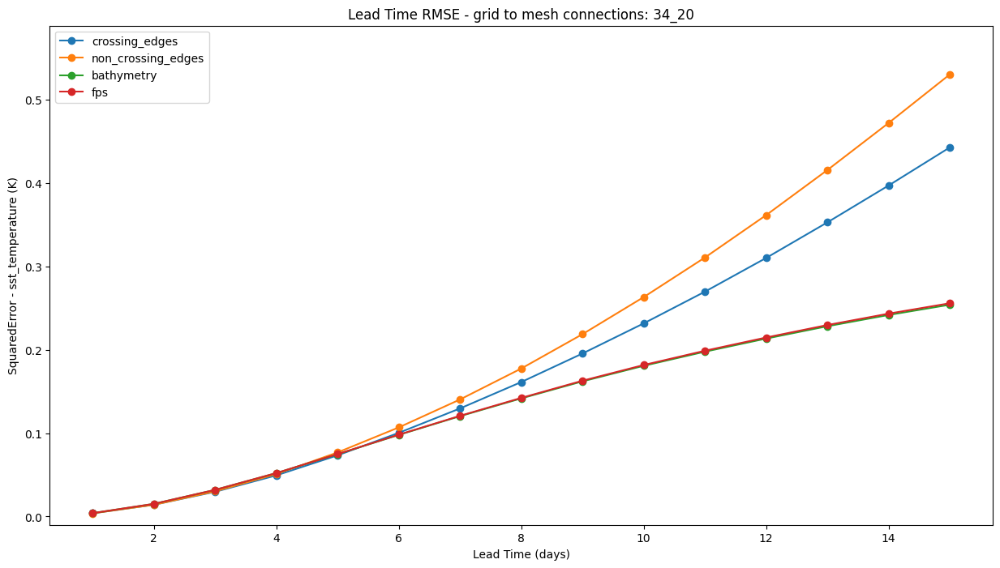

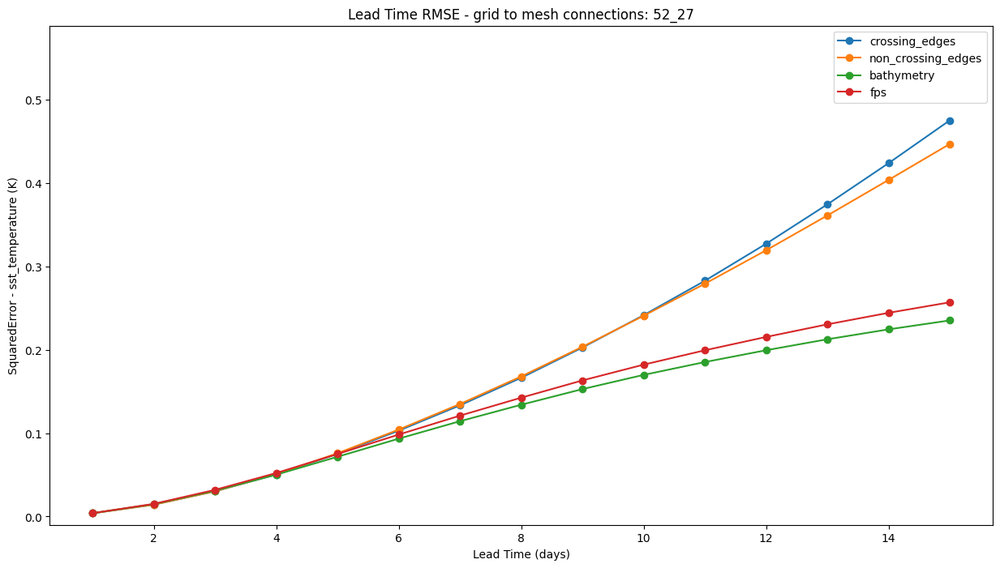

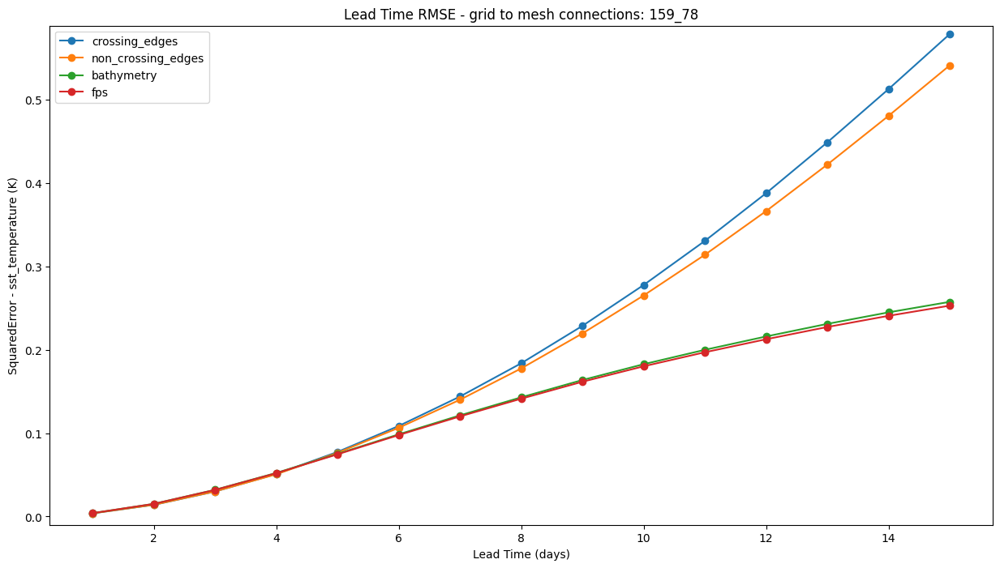

In [10]:
# Number of rows for the plot grid depending on the number of scores
for n_nodes in NNodes:
    fig, axs = plt.subplots(1, 1, figsize=(15, 8))

    axs = plot_rmse(exp_dic, n_nodes, axs)
    axs.set_ylim(glob_min-0.01, glob_max+0.01)
    plt.savefig(f"/home/giovanny/Seacast/reports/figures/rmse_lead_time_{n_nodes.name}.pdf", bbox_inches='tight')

In [11]:
from sklearn.linear_model import LinearRegression
def get_slope(lead_day_scores):
    X = np.arange(len(lead_day_scores)).reshape(-1,1)
    y = np.array(lead_day_scores)
    model = LinearRegression().fit(X, y)
    return model.coef_[0]  # Pendiente de la serie completa

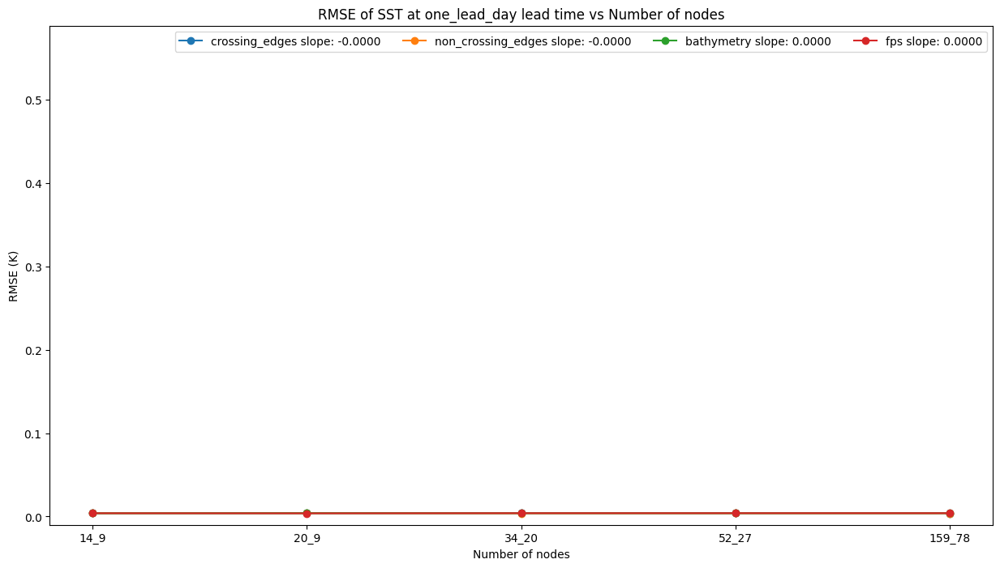

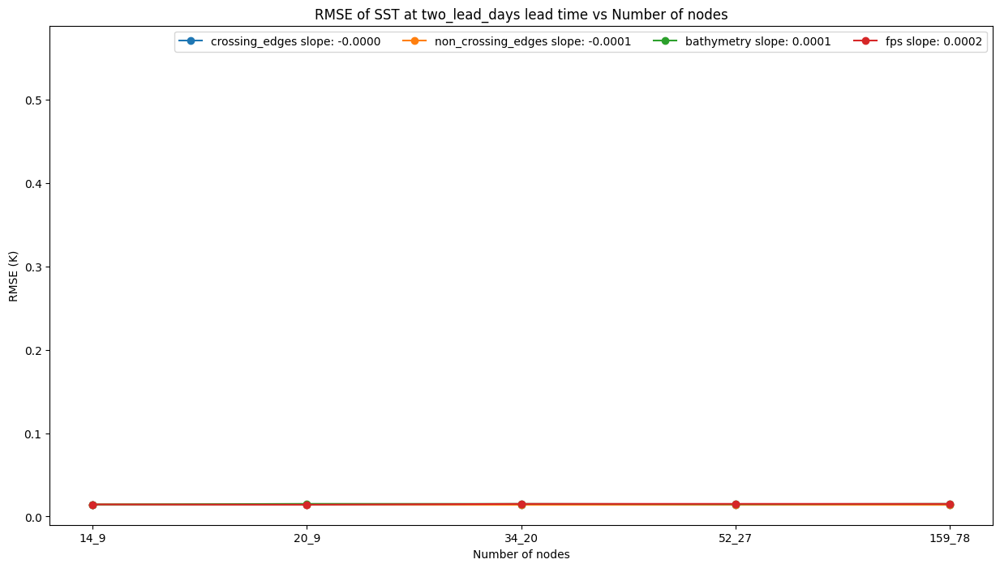

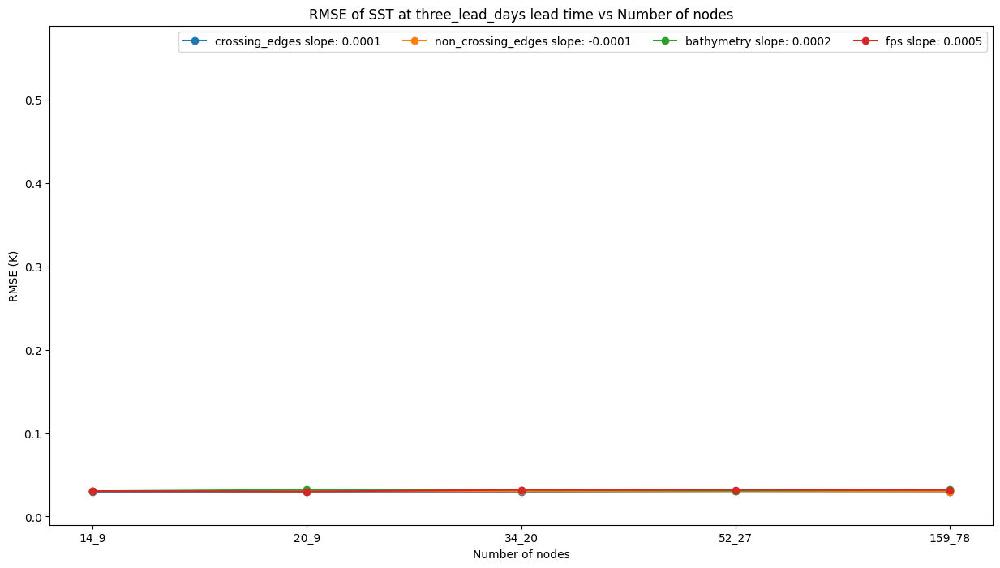

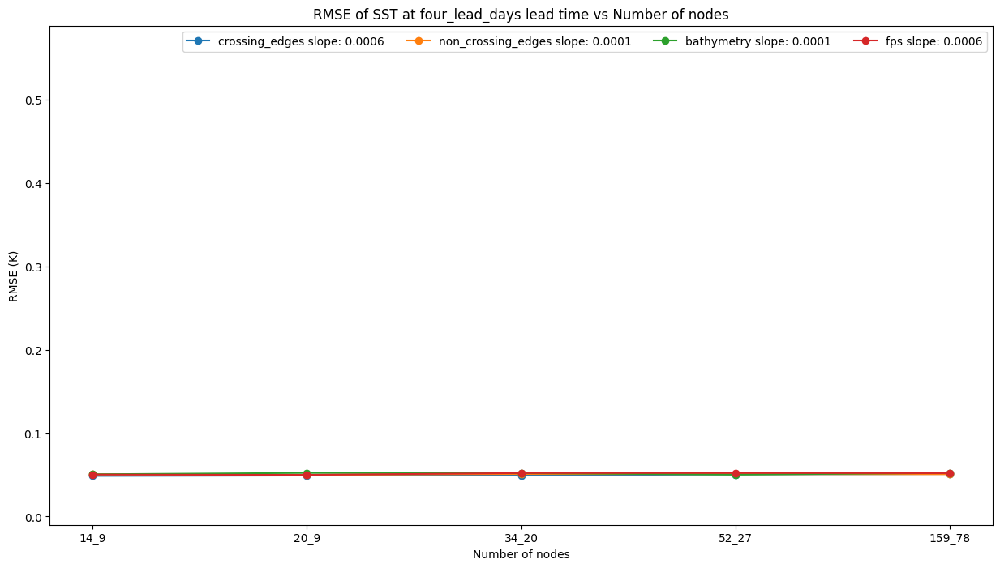

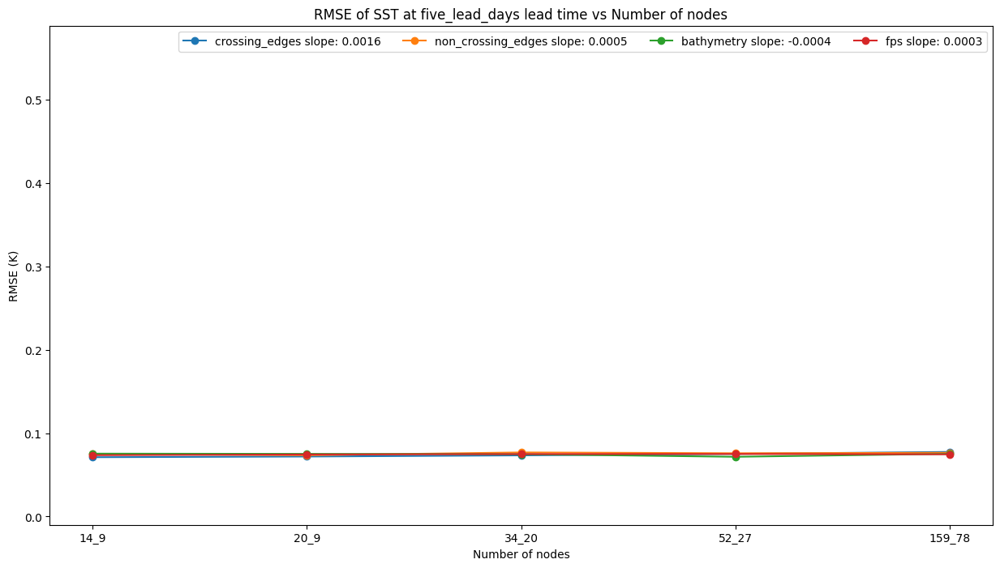

...

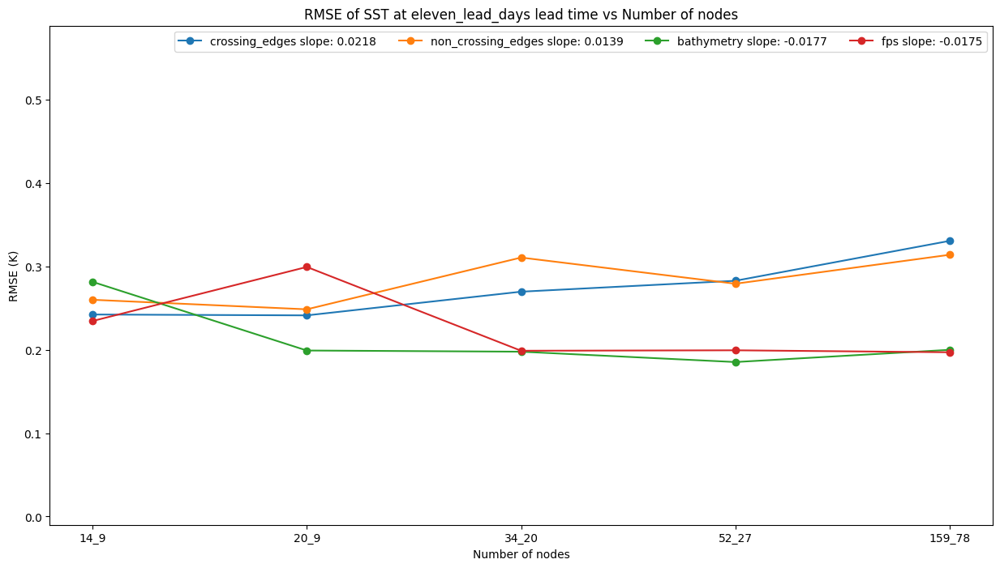

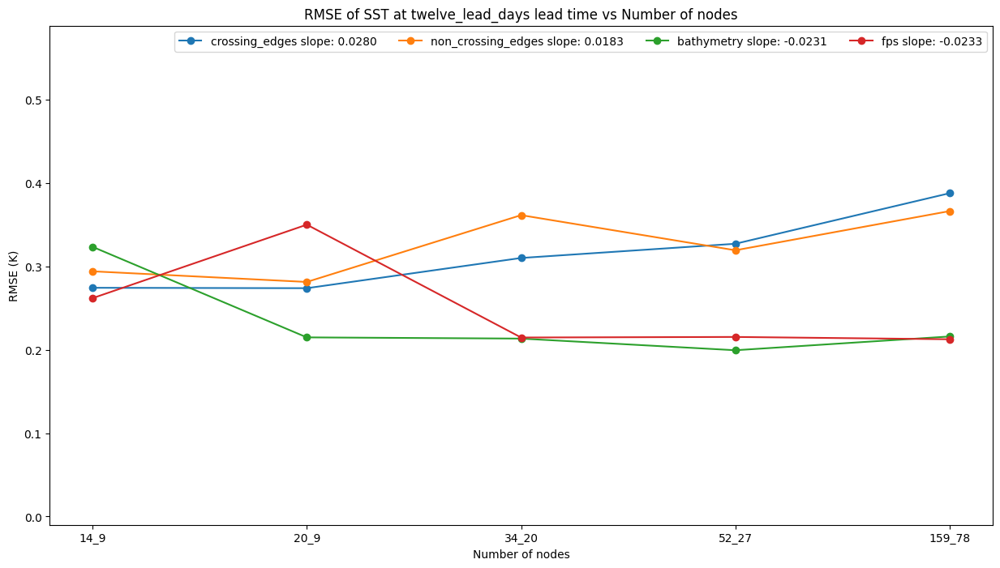

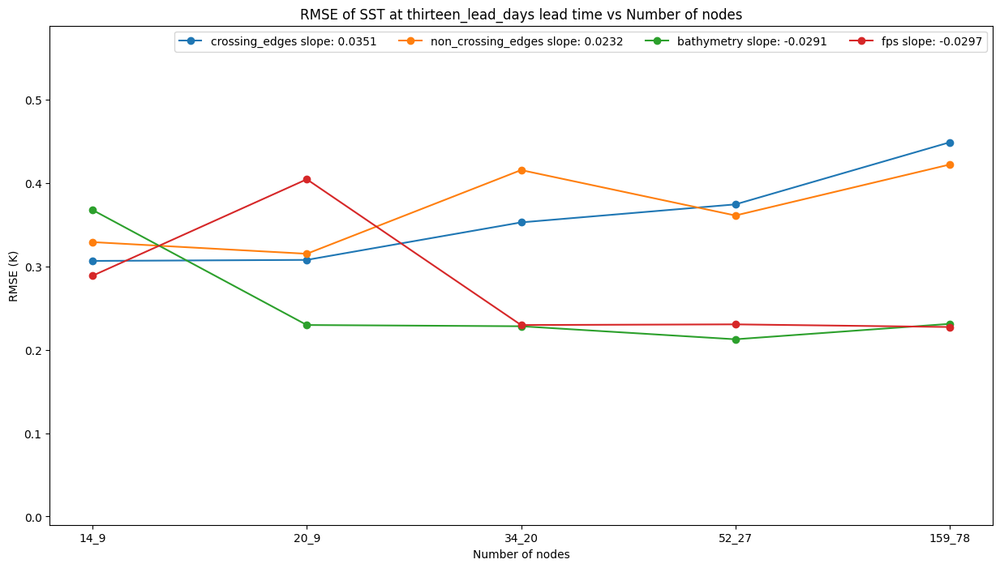

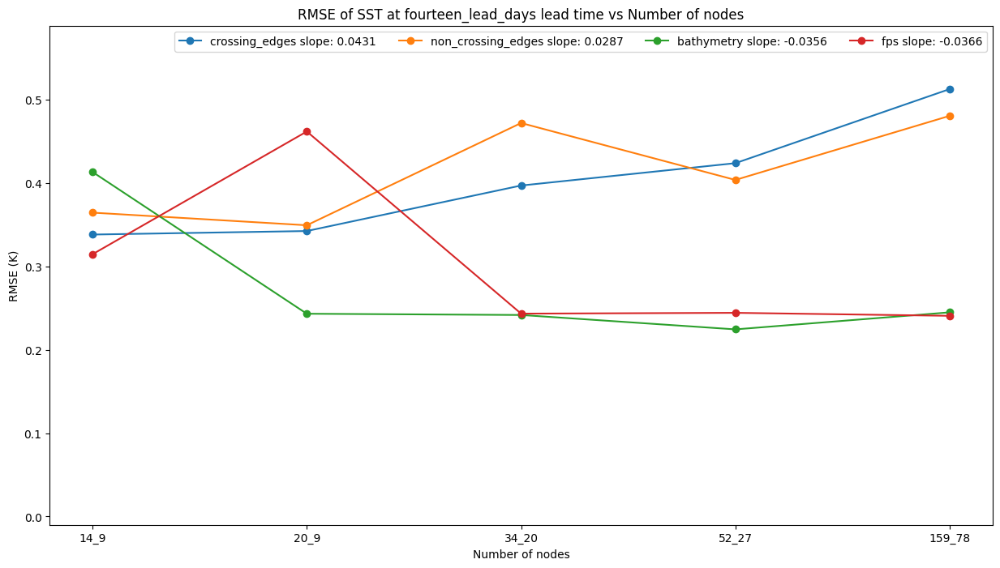

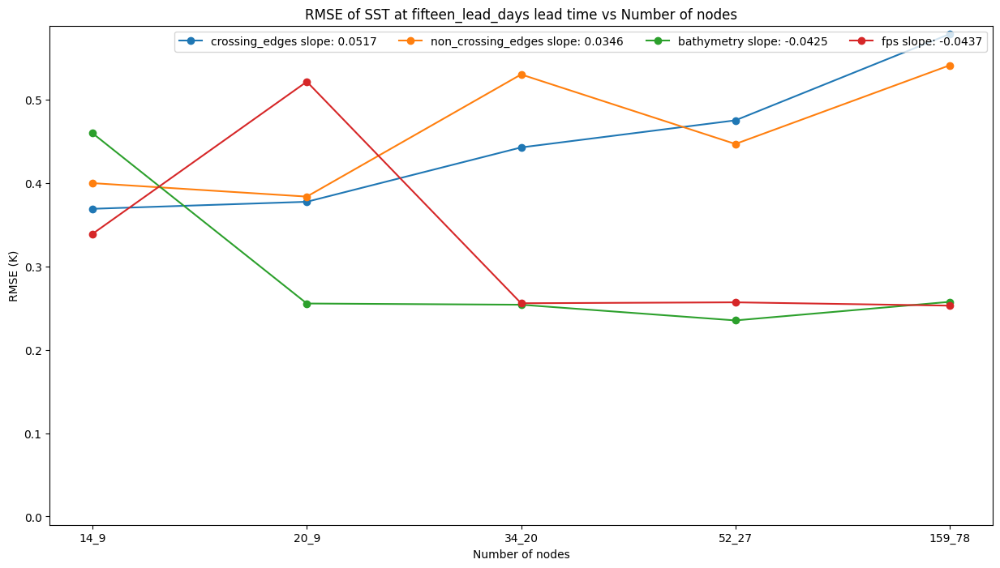

In [ ]:
variable = TypeVariable.sst_temperature.value
score = TypeScore.RMSE.value
# Plotting RMSE of SST at different lead times vs Number of nodes for different mesh types
for lead_day in LeadTime:
    fig, axs = plt.subplots(1, 1, figsize=(15, 8))
    for mesh in TypeMesh:
        lead_day_scores = []
        for enum in NNodes:
            if enum not in exp_dic[mesh]:
                continue
            lead_day_scores.append(
                exp_dic[mesh][enum][score][variable]
                .sel(lead_time=lead_day.value).data.item()
                )
        # Number of rows for the plot grid depending on the number of scores
        axs.plot(
            [enum.num for enum, _ in zip(NNodes, lead_day_scores)], lead_day_scores, 
            marker='o', linestyle='-', label=f"{mesh.value} slope: {get_slope(lead_day_scores):.4f}"
            )
        axs.set_ylim(glob_min-0.01, glob_max+0.01)
        axs.set_ylabel('RMSE (K)')
        axs.set_xlabel('Number of nodes')
        axs.set_title(f'RMSE of SST at {lead_day.name} lead time vs Number of nodes')
        axs.legend(loc='upper right', ncols=len(TypeMesh))
        plt.savefig(f"/home/giovanny/Seacast/reports/figures/rmse_n_nodes_all_cfg_lead_time_{lead_day.name}.pdf", bbox_inches='tight')
s

## Spatial performance
---

In [13]:
# Create a dictionary of experiments grouped by the last character of the experiment name
exp_dic = as_stats_dict(experiments, ['init_time'])

  0%|          | 0/20 [00:00<?, ?it/s]

:: Mesh: crossing_edges
:: Mesh: non_crossing_edges
:: Mesh: bathymetry
:: Mesh: fps


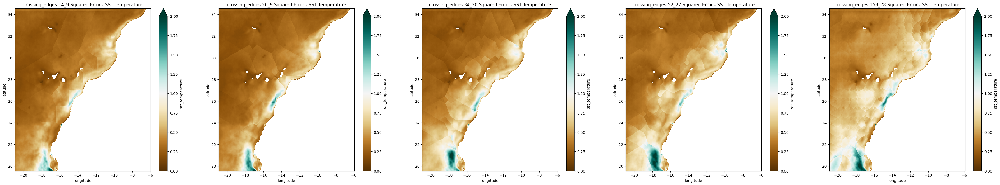

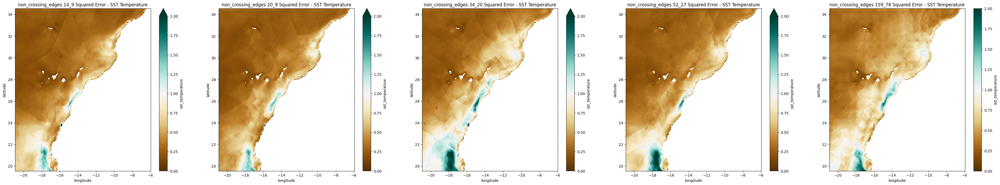

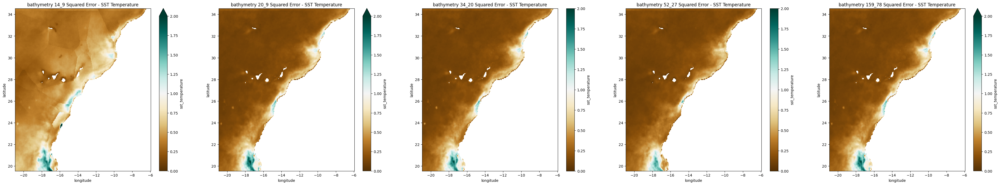

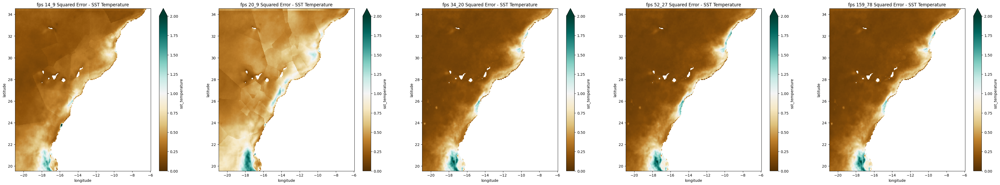

In [14]:
for mesh in TypeMesh:
    print(f":: Mesh: {mesh.value}")
    # Parameters for the map scores
    score = TypeScore.RMSE
    var_name = TypeVariable.sst_temperature
    lead_days = [14]  # Example lead times to filter

    size = 8
    n_exp = len(NNodes)
    fig, axs = plt.subplots(1, n_exp, figsize=(n_exp*size + size, size))
    axs_f = axs.flatten() if hasattr(axs, 'flatten') else axs
    vmin, vmax = 0.0, 2.0  # Ajusta según tu rango esperado de error
    for ax, n_nodes in zip(axs_f, NNodes): 
        data = filter_statistics(
            exp_dic[mesh][n_nodes],
            'lead_time',
            lead_days,
            )[score.value][var_name.value].squeeze()
            
        data.plot(
            x="longitude",
            y="latitude",
            cmap='BrBG',
            rasterized=True,
            ax=ax,
            vmin=vmin,
            vmax=vmax,
            )
        ax.set_title(f"{mesh.value} {n_nodes.value[0]} Squared Error - SST Temperature")
    plt.savefig(f"/home/giovanny/Seacast/reports/figures/rmse_map_all_n_nodes_cfg_{mesh.value}.pdf", bbox_inches='tight')

:: Mesh: crossing_edges
:: vmin: 0.00022496472229249775, vmax: 3.203737497329712
:: Mesh: non_crossing_edges
:: vmin: 0.0002344684471609071, vmax: 3.083707571029663
:: Mesh: bathymetry
:: vmin: 0.00013591408787760884, vmax: 4.346834182739258
:: Mesh: fps
:: vmin: 0.00018188220565207303, vmax: 3.3948452472686768


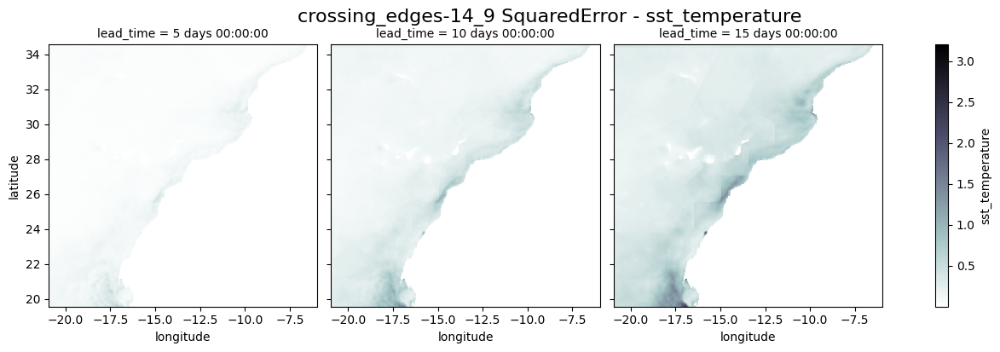

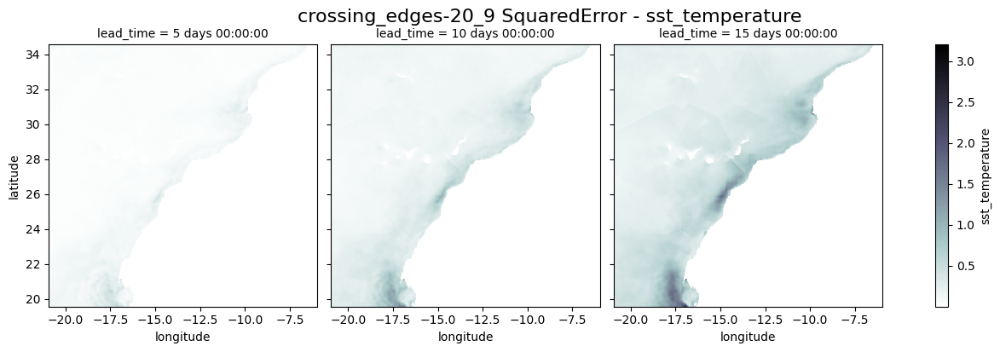

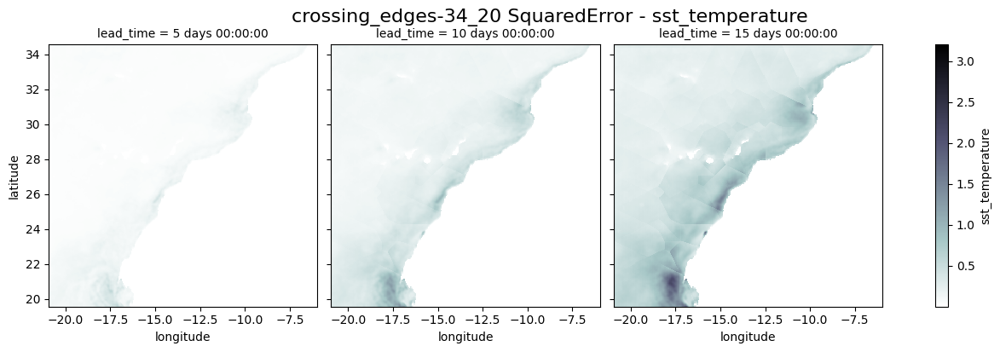

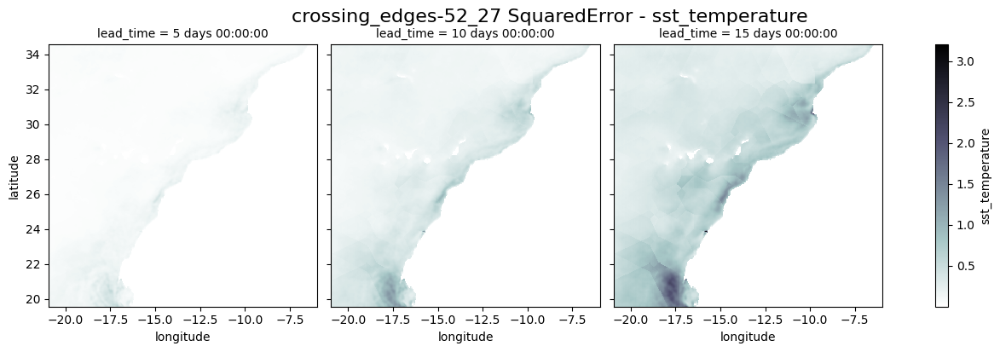

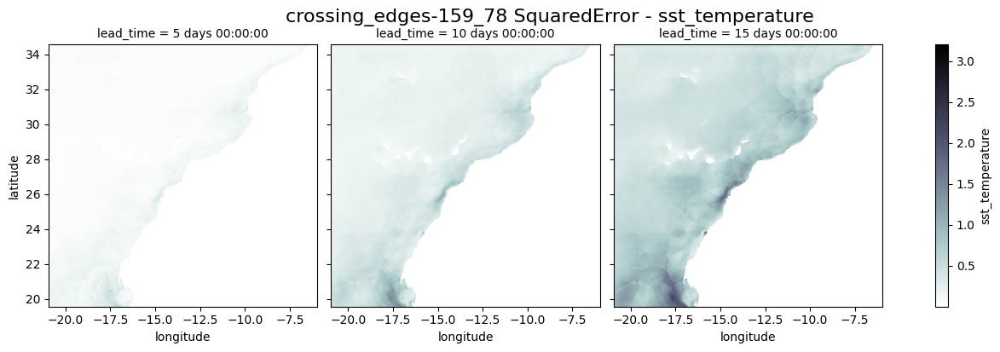

...

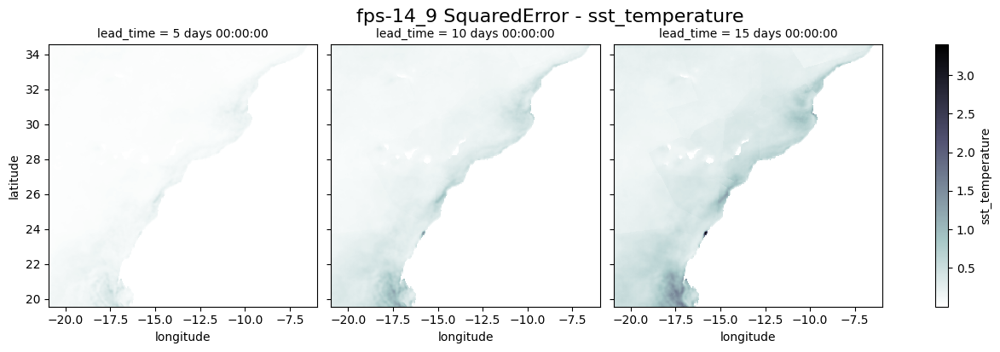

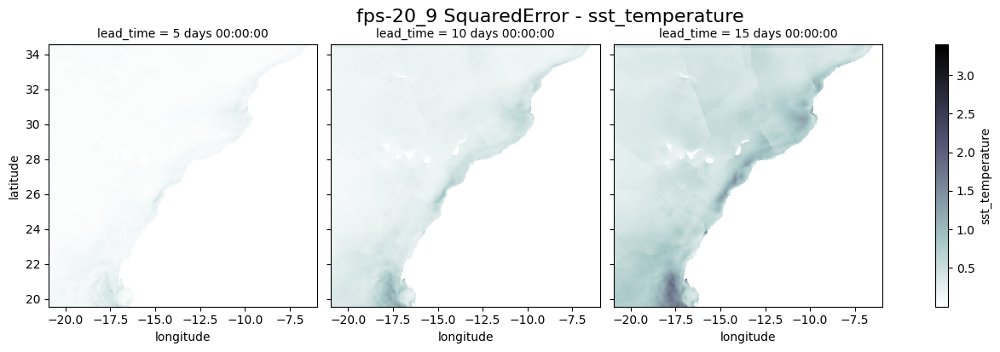

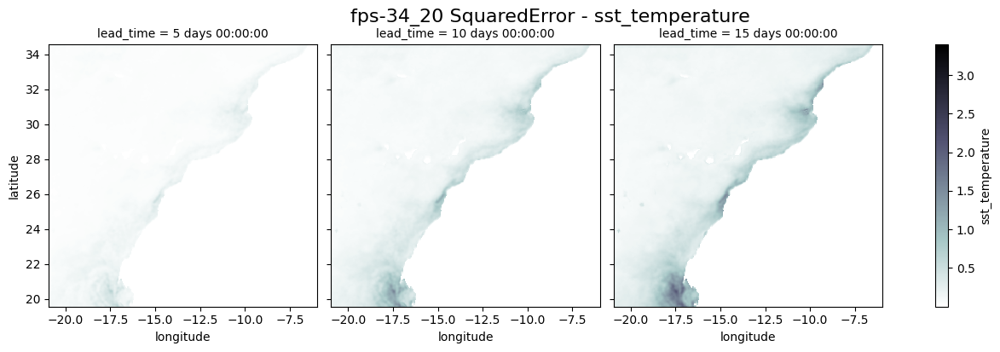

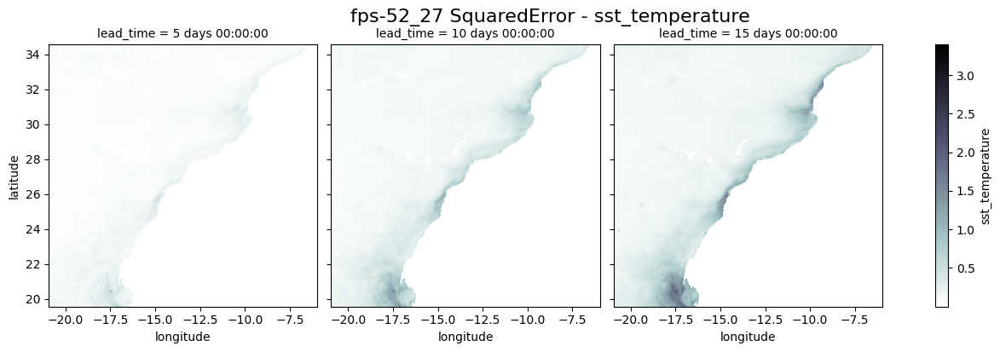

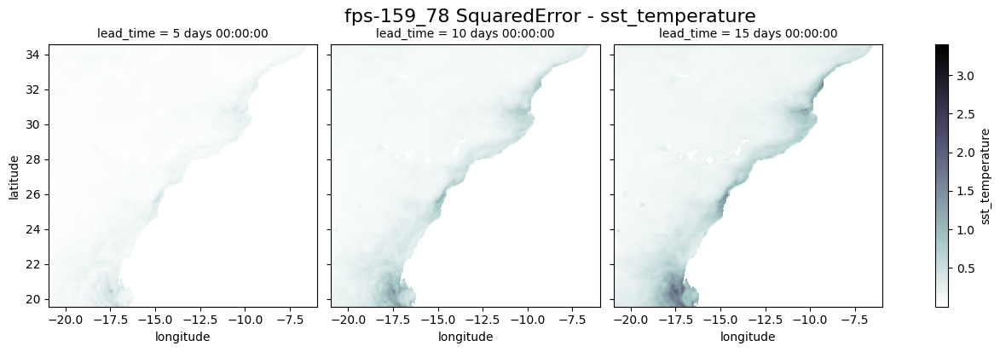

In [25]:
for mesh in TypeMesh:
    # Compute the minimum and maximum values for the map scores
    vmin_exp = []
    vmax_exp = [] 
    # Compute the minimum and maximum values for the map scores
    for n_nodes in NNodes:
        vmin_data, vmax_data = get_min_max(exp_dic[mesh][n_nodes])
        vmin_exp.append(vmin_data[TypeScore.RMSE.value][TypeVariable.sst_temperature.value])
        vmax_exp.append(vmax_data[TypeScore.RMSE.value][TypeVariable.sst_temperature.value])
    # Compute the overall minimum and maximum values
    vmin = min(vmin_exp)
    vmax = max(vmax_exp)
    print(f":: Mesh: {mesh.value}")
    print(f":: vmin: {vmin}, vmax: {vmax}")

    for n_nodes in NNodes:
        plot_map_scores(
            exp_name=mesh.value + f'-{n_nodes.value[0]}',
            score_name=TypeScore.RMSE.value,
            variable_names=[TypeVariable.sst_temperature.value],
            map_scores=filter_statistics(
                exp_dic[mesh][n_nodes],
                'lead_time',
                [4, 9, 14],
                ),
            vmin=vmin,
            vmax=vmax,
            n_cols=3,
            cmap='coolwarm' if TypeScore.RMSE.value == 'Error' else 'bone_r'
            )

## FPS with a more nodes
---

In [65]:
# Create a Enums for different types
class NNodes(Enum):
    def __init__(self, num):
        self.num = num

    N14_9 = ("14_9")
    N20_9 = ("20_9")
    N34_20 = ("34_20")
    N52_27 = ("52_27")
    N159_78 = ("159_78")

    N240_122 = ("240_122")
    N394_196 = ("394_196")
    N632_343 = ("632_343")
    N1006_524 = ("1006_524")
    N1638_869 = ("1638_869")

    @classmethod
    def get(cls, key):
        for member in cls:
            if key in (member.num, member.name):
                return member
        raise ValueError(f"{key} no corresponde a ningún miembro")
    
class TypeMesh(Enum):
    fps = 'fps'

In [66]:
%%time
unstructured_nodes = ["14_9", "20_9", "34_20", "52_27", "159_78"]
# mesh file names sequences
fps_mesh_names = [f"fps_noweighted_m_{node}_g2mm2g_4" for node in unstructured_nodes]
# load all experiments
experiments = [
    StatsLoader(os.path.join("~/Seacast/output/increase_n_nodes", exp_name)) 
    for exp_name in fps_mesh_names
    ]
# number of nodes sequence for unstructured and structured meshes
unstructured_nodes = ["240_122", "394_196", "632_343", "1006_524", "1638_869"]
# mesh file names sequences
experiments_names = [f"fps_m_{node}_g2mm2g_4" for node in unstructured_nodes]
    
# load all experiments
experiments = experiments + [
    StatsLoader(os.path.join("~/Seacast/output/", exp_name)) 
    for exp_name in experiments_names
    ]
# Rename no weighted experiments
for exp in experiments:
    if "noweighted" in exp.name:
        exp.name = exp.name.replace("noweighted_", "")
# Create a dictionary of experiments grouped by the last character of the experiment name
exp_dic = as_stats_dict(experiments, ['init_time', 'latitude', 'longitude'])  

  0%|          | 0/10 [00:00<?, ?it/s]

CPU times: user 1min 45s, sys: 1min 43s, total: 3min 28s
Wall time: 3min 28s


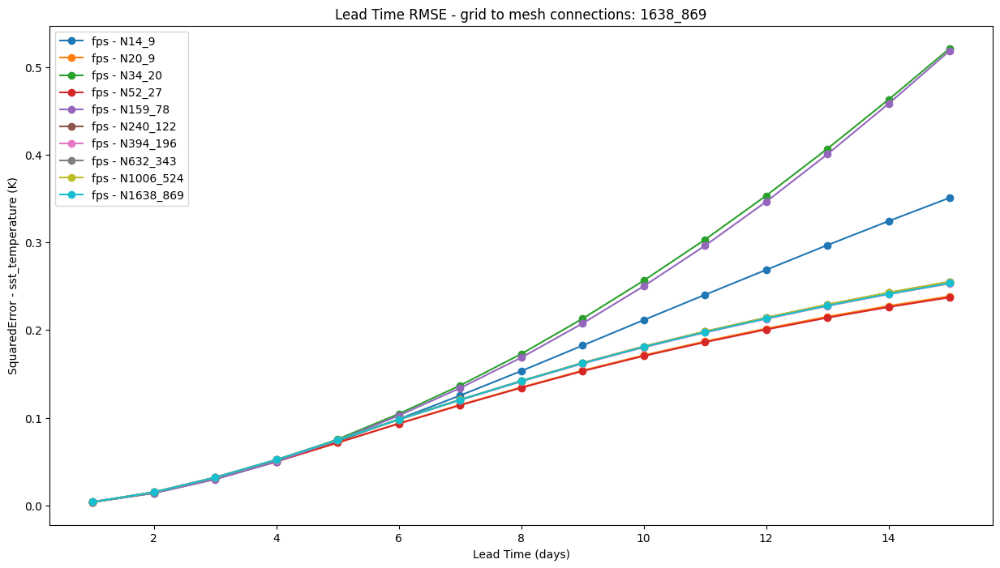

In [51]:
fig, axs = plt.subplots(1, 1, figsize=(15, 8))
for n_nodes in NNodes:
    axs = plot_rmse(exp_dic, n_nodes, axs)
    # Update line label
    line = axs.lines[-1]
    line.set_label(f'fps - {n_nodes.name}')
axs.legend()  # actualizar la leyenda con las nuevas etiquetas


In [ ]:
glob_min, glob_max = get_global_min_max(exp_dic)
glob_min, glob_max 

(0.0, 0.5212361812591553)

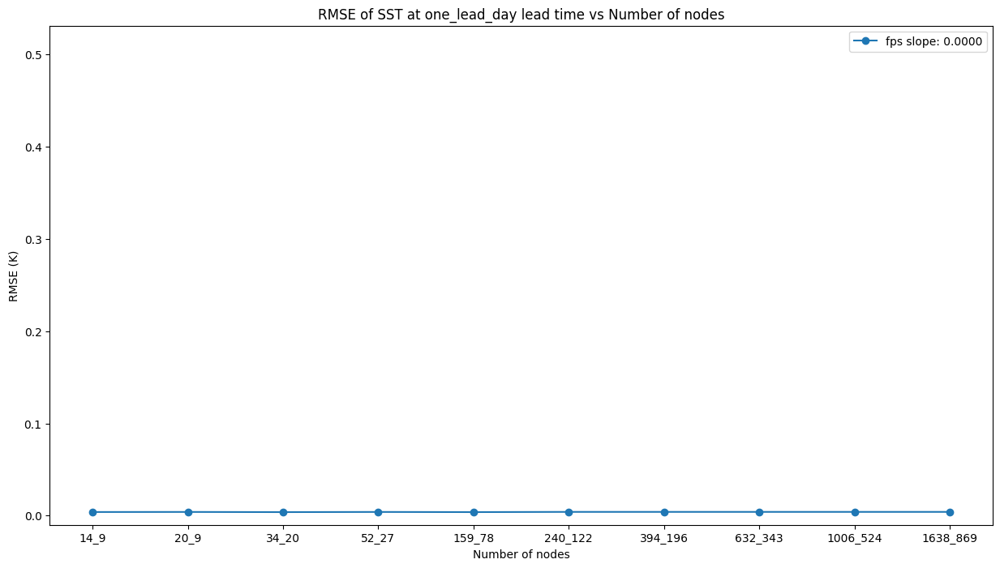

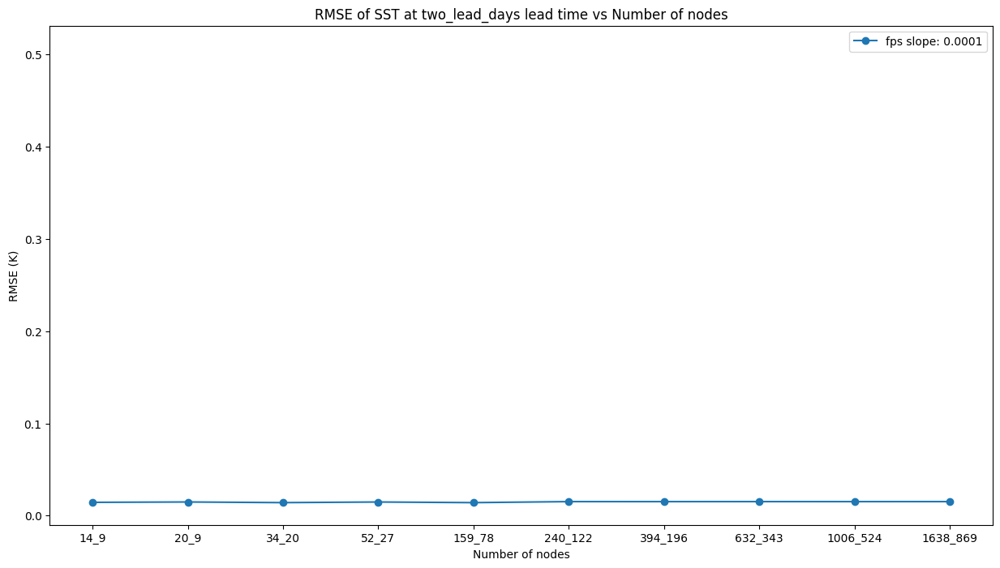

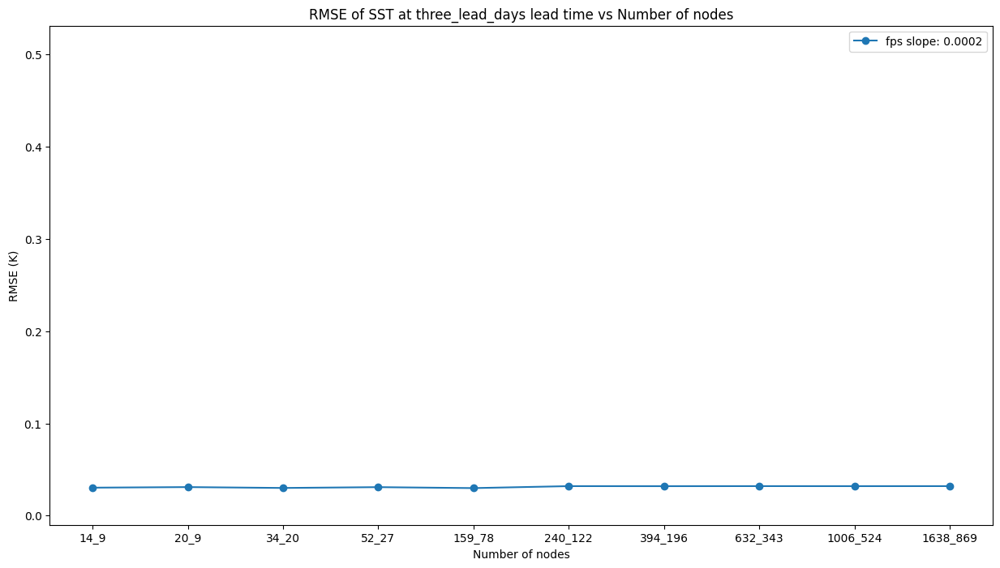

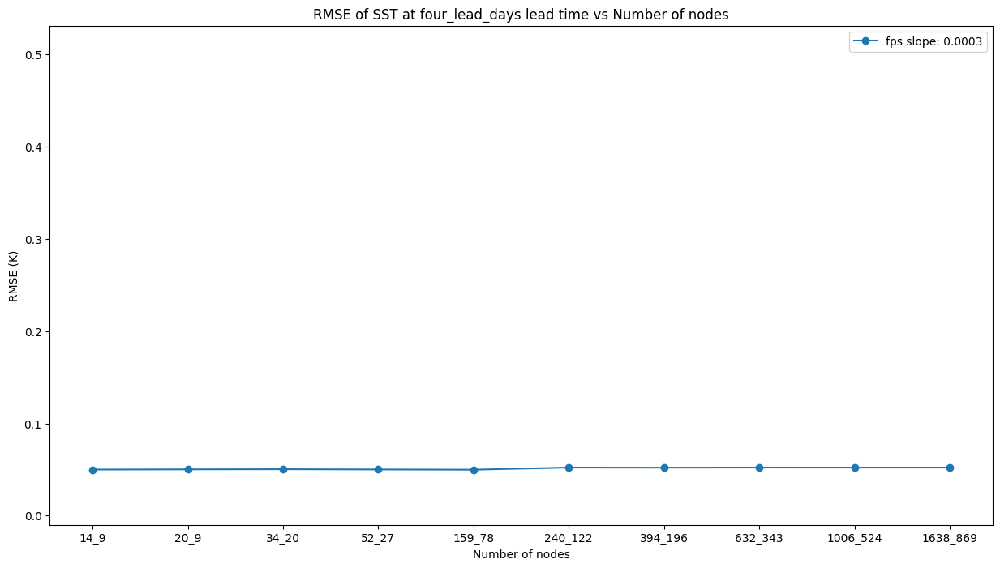

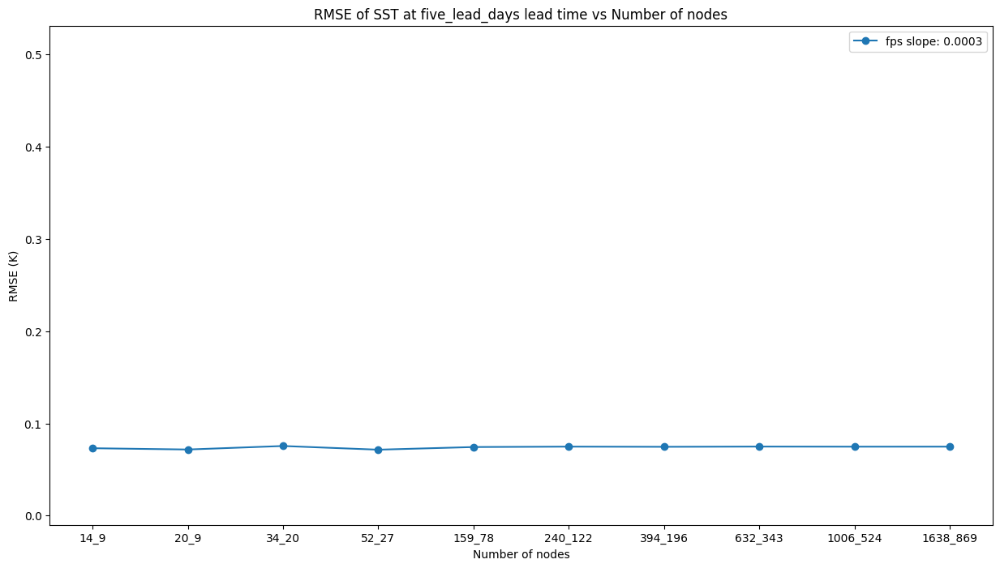

...

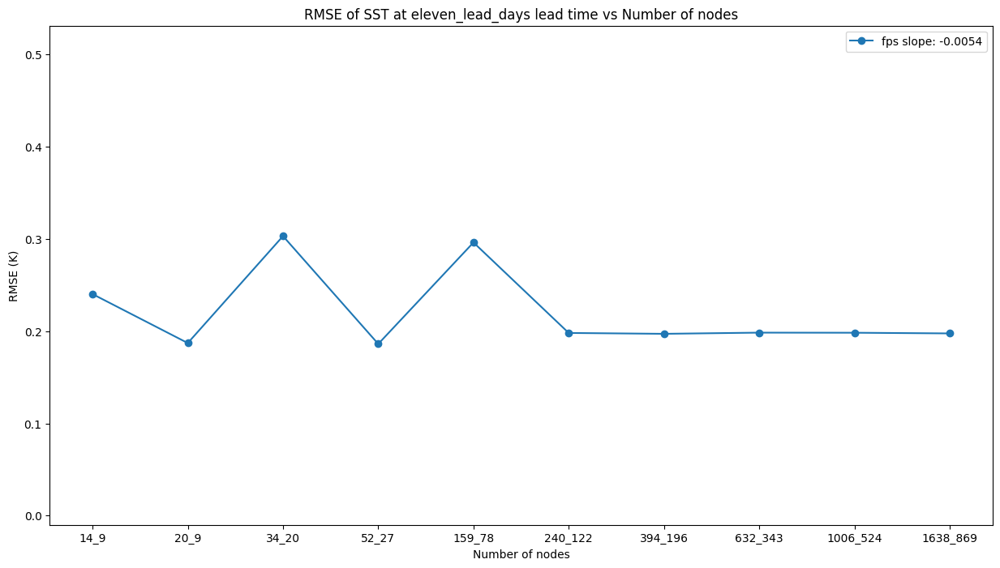

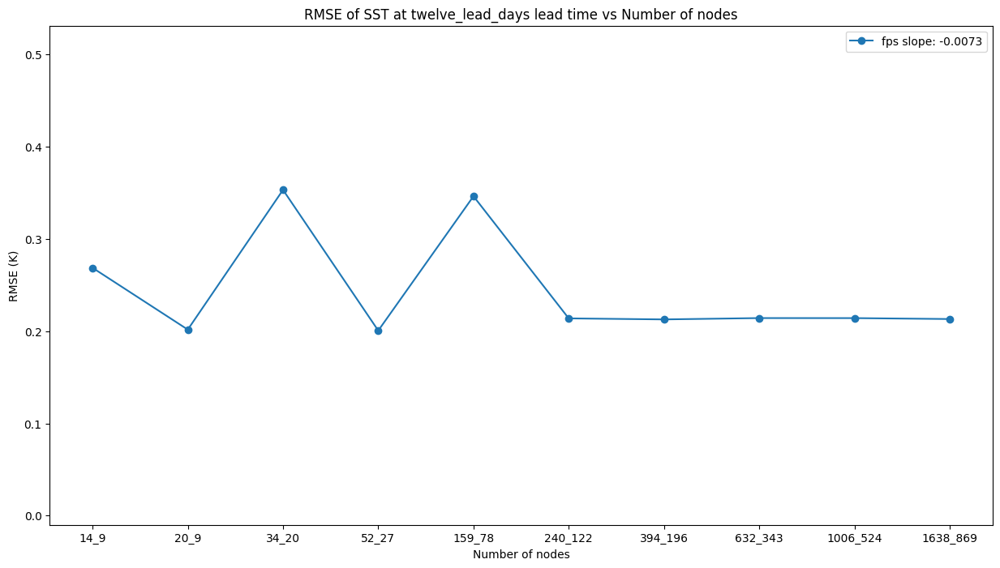

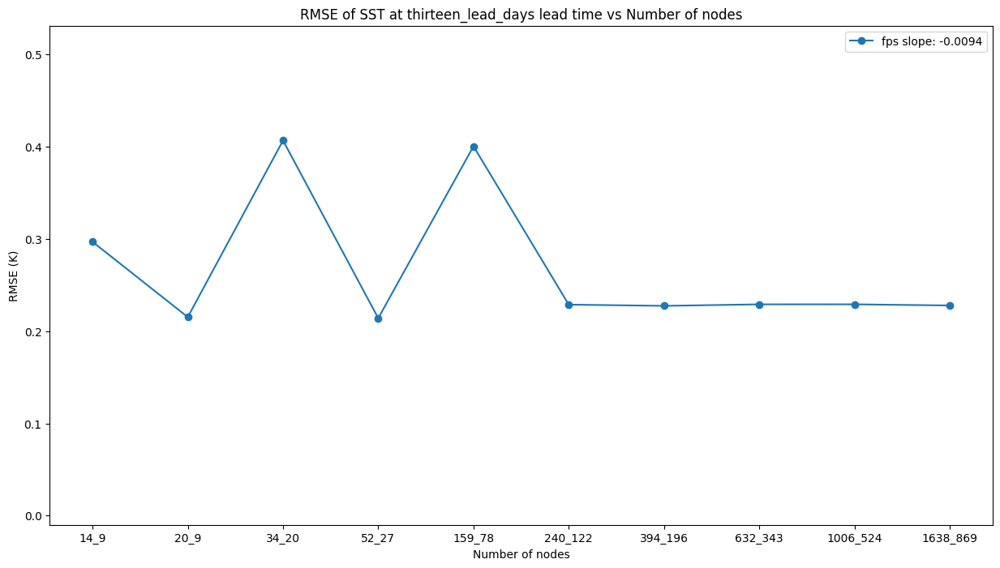

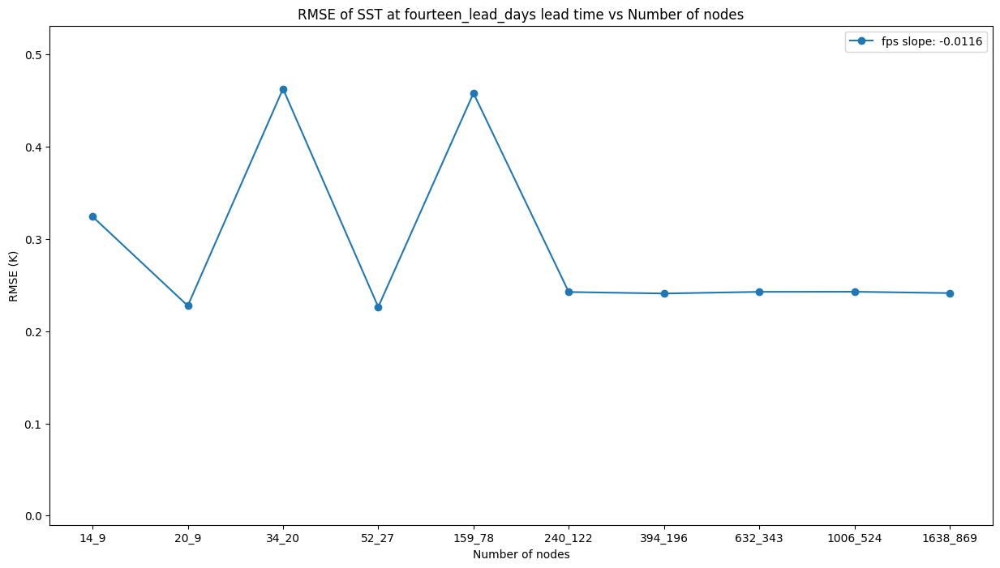

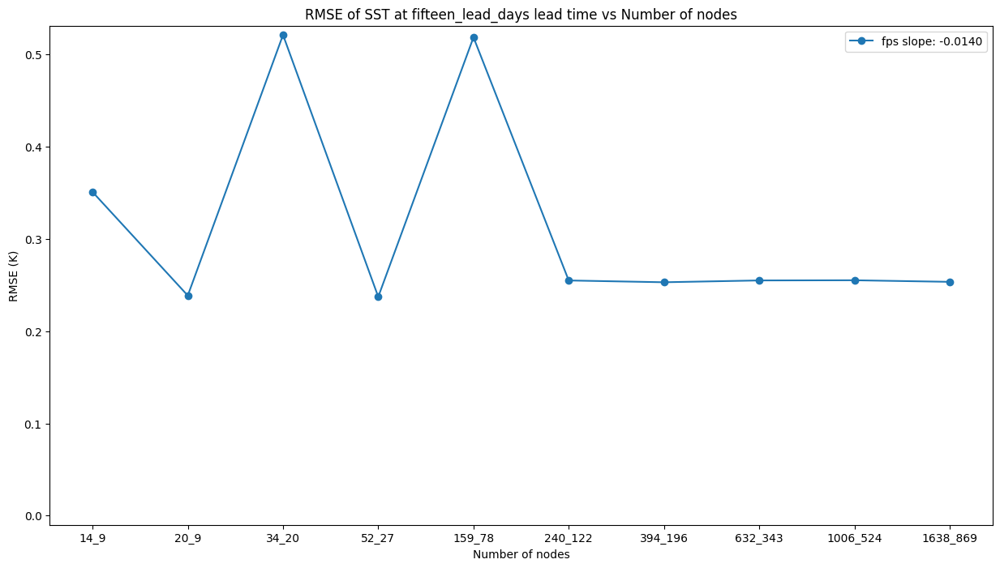

In [76]:
variable = TypeVariable.sst_temperature.value
score = TypeScore.RMSE.value
# Plotting RMSE of SST at different lead times vs Number of nodes for different mesh types
for lead_day in LeadTime:
    fig, axs = plt.subplots(1, 1, figsize=(15, 8))
    for mesh in TypeMesh:
        lead_day_scores = []
        for enum in NNodes:
            if enum not in exp_dic[mesh]:
                continue
            lead_day_scores.append(
                exp_dic[mesh][enum][score][variable]
                .sel(lead_time=lead_day.value).data.item()
                )
        # Number of rows for the plot grid depending on the number of scores
        axs.plot(
            [enum.num for enum, _ in zip(NNodes, lead_day_scores)], lead_day_scores, 
            marker='o', linestyle='-', label=f"{mesh.value} slope: {get_slope(lead_day_scores):.4f}"
            )
        axs.set_ylim(glob_min-0.01, glob_max+0.01)
        axs.set_ylabel('RMSE (K)')
        axs.set_xlabel('Number of nodes')
        axs.set_title(f'RMSE of SST at {lead_day.name} lead time vs Number of nodes')
        axs.legend(loc='upper right', ncols=len(TypeMesh))

In [ ]:
# Aggregate by init_time only
# ---------------------------
# - Note: This will create a dictionary grouped only by init_time it means
#  that all experiments will have spatial dimensions.
exp_dic = as_stats_dict(experiments, ['init_time'])

  0%|          | 0/10 [00:00<?, ?it/s]

:: Mesh: fps


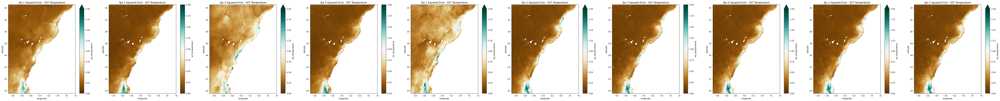

In [56]:
for mesh in TypeMesh:
    print(f":: Mesh: {mesh.value}")
    # Parameters for the map scores
    score = TypeScore.RMSE
    var_name = TypeVariable.sst_temperature
    lead_days = [14]  # Example lead times to filter

    size = 8
    n_exp = len(NNodes)
    fig, axs = plt.subplots(1, n_exp, figsize=(n_exp*size + size, size))
    axs_f = axs.flatten() if hasattr(axs, 'flatten') else axs
    vmin, vmax = 0.0, 2.0  # Ajusta según tu rango esperado de error
    for ax, n_nodes in zip(axs_f, NNodes): 
        data = filter_statistics(
            exp_dic[mesh][n_nodes],
            'lead_time',
            lead_days,
            )[score.value][var_name.value].squeeze()
            
        data.plot(
            x="longitude",
            y="latitude",
            cmap='BrBG',
            rasterized=True,
            ax=ax,
            vmin=vmin,
            vmax=vmax,
            )
        ax.set_title(f"{mesh.value} {n_nodes.value[0]} Squared Error - SST Temperature")

:: Mesh: fps
:: vmin: 0.00011626626655925065, vmax: 3.385838747024536


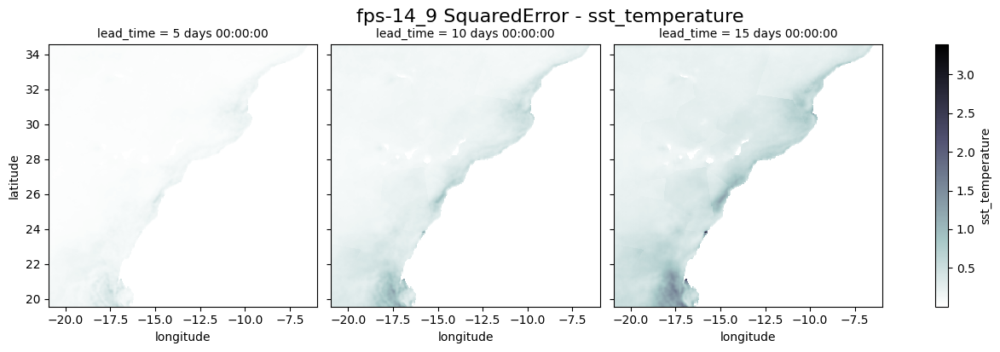

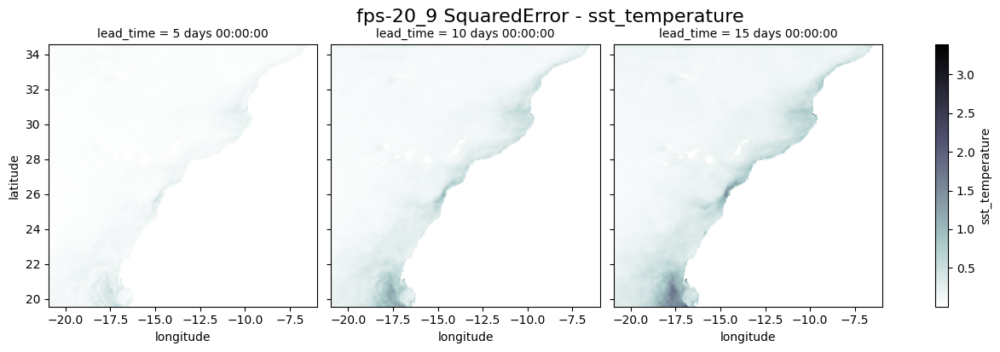

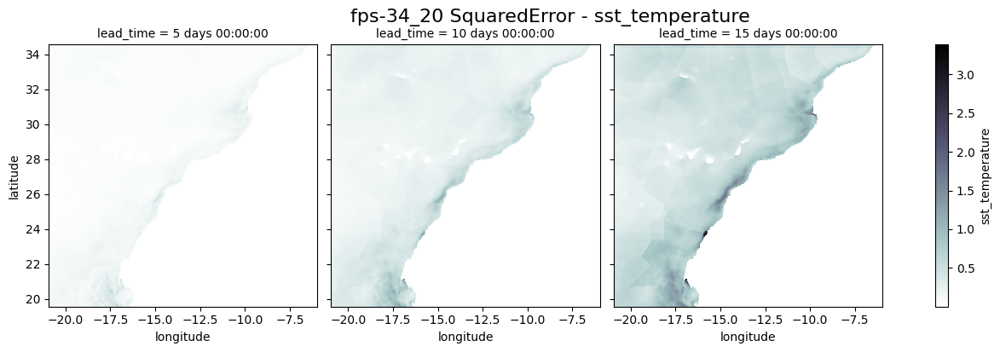

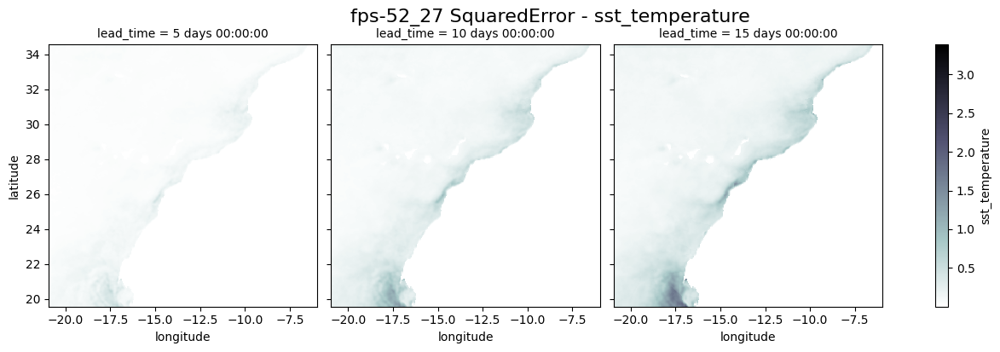

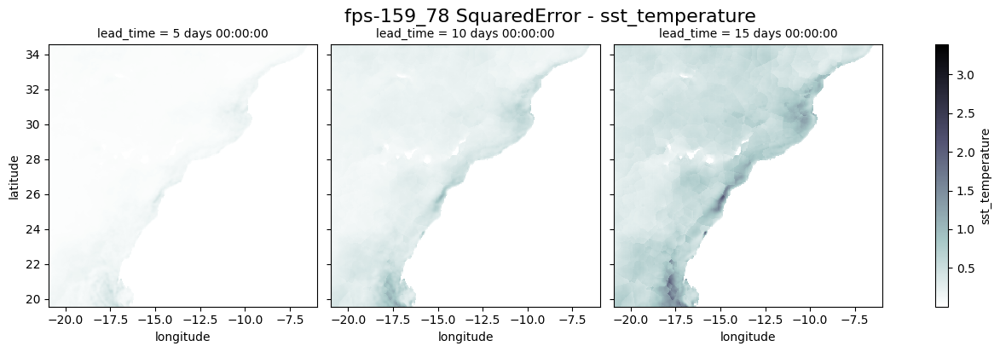

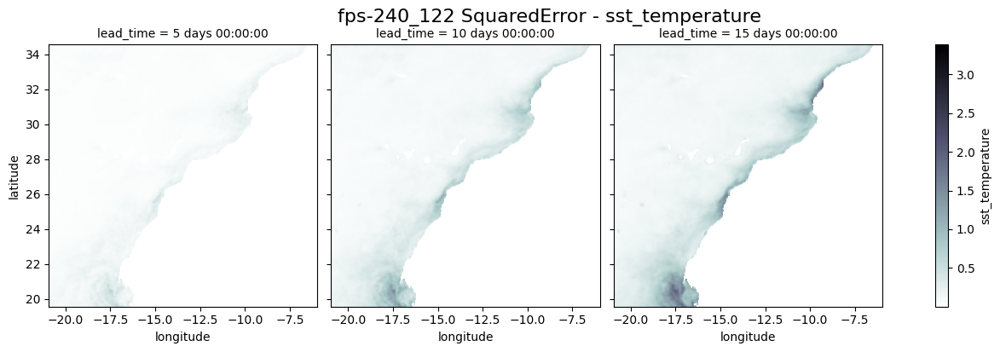

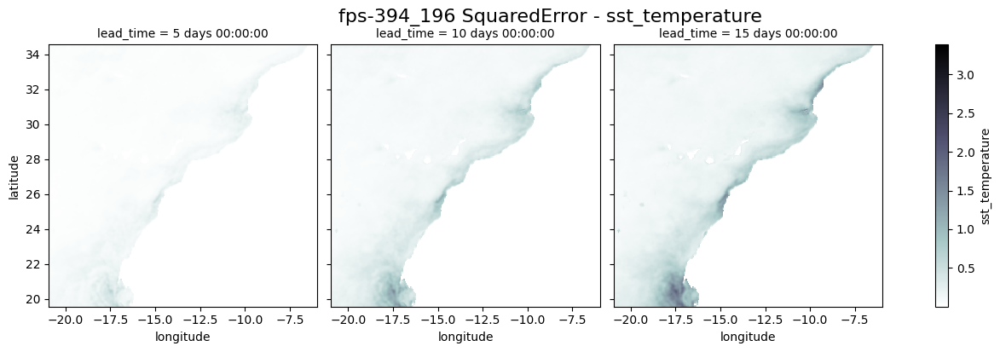

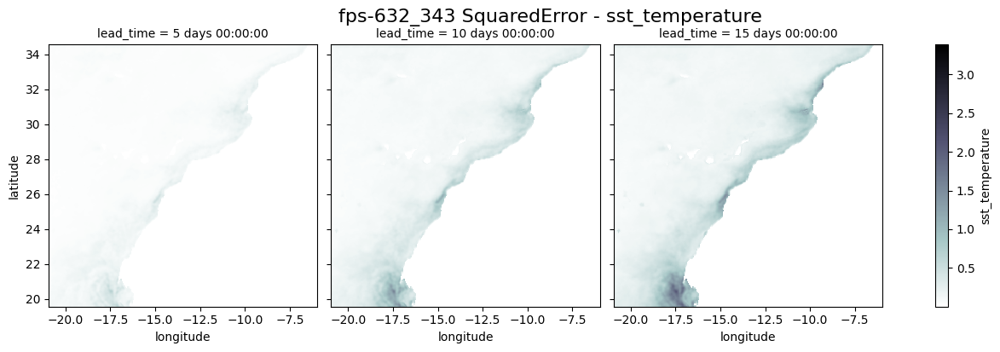

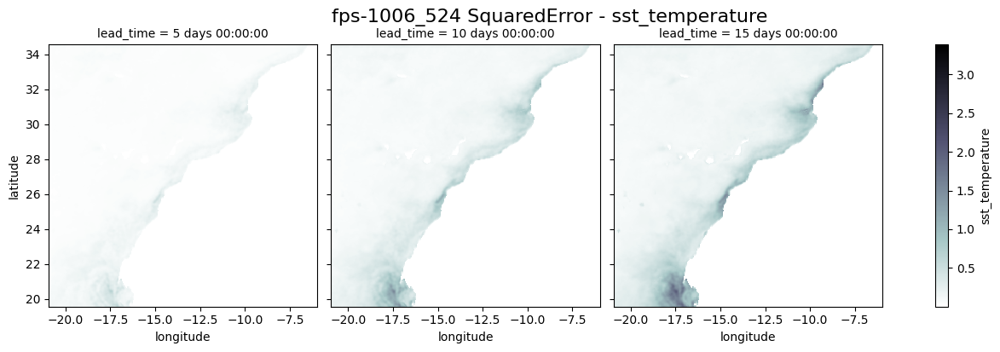

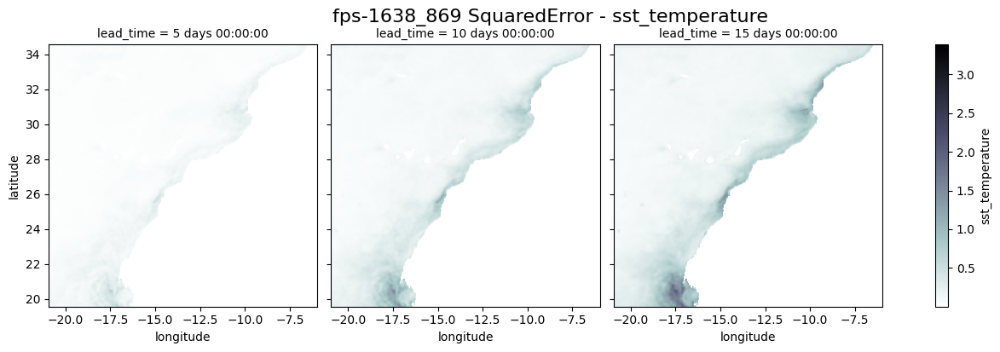

In [58]:
for mesh in TypeMesh:
    # Compute the minimum and maximum values for the map scores
    vmin_exp = []
    vmax_exp = [] 
    # Compute the minimum and maximum values for the map scores
    for n_nodes in NNodes:
        vmin_data, vmax_data = get_min_max(exp_dic[mesh][n_nodes])
        vmin_exp.append(vmin_data[TypeScore.RMSE.value][TypeVariable.sst_temperature.value])
        vmax_exp.append(vmax_data[TypeScore.RMSE.value][TypeVariable.sst_temperature.value])
    # Compute the overall minimum and maximum values
    vmin = min(vmin_exp)
    vmax = max(vmax_exp)
    print(f":: Mesh: {mesh.value}")
    print(f":: vmin: {vmin}, vmax: {vmax}")

    for n_nodes in NNodes:
        plot_map_scores(
            exp_name=mesh.value + f'-{n_nodes.value}',
            score_name=TypeScore.RMSE.value,
            variable_names=[TypeVariable.sst_temperature.value],
            map_scores=filter_statistics(
                exp_dic[mesh][n_nodes],
                'lead_time',
                [4, 9, 14],
                ),
            vmin=vmin,
            vmax=vmax,
            n_cols=3,
            cmap='coolwarm' if TypeScore.RMSE.value == 'Error' else 'bone_r'
            )